# Object Detection with YOLOv5

## Part abc)
- Load model, install stuff and so on.

In [1]:
!git clone https://github.com/ultralytics/yolov5  # clone
%cd yolov5
%pip install -qr requirements.txt  # install
%cd ..

Cloning into 'yolov5'...
remote: Enumerating objects: 14998, done.
remote: Counting objects: 100% (3/3), done.
remote: Compressing objects: 100% (3/3), done.
remote: Total 14998 (delta 0), reused 1 (delta 0), pack-reused 14995
Receiving objects: 100% (14998/14998), 14.03 MiB | 21.06 MiB/s, done.
Resolving deltas: 100% (10286/10286), done.
/kaggle/working/yolov5
Note: you may need to restart the kernel to use updated packages.
/kaggle/working


In [2]:
!git clone https://github.com/BathVisArtData/PeopleArt.git

Cloning into 'PeopleArt'...
remote: Enumerating objects: 6568, done.
remote: Total 6568 (delta 0), reused 0 (delta 0), pack-reused 6568
Receiving objects: 100% (6568/6568), 170.80 MiB | 38.64 MiB/s, done.
Resolving deltas: 100% (1676/1676), done.


In [3]:
# useful library to read voc xml files
!pip install pascal-voc

  Preparing metadata (setup.py) ... - done
  Created wheel for pascal-voc: filename=pascal_voc-0.0.3-py3-none-any.whl size=6072 sha256=9ceaf2f8ccb253f7b8b264dc42b6ba05a4c1b9bbf9954a30c595a396b27f4d0e
  Stored in directory: /root/.cache/pip/wheels/fd/f1/43/cc3001e80d2afc4e028251231cc5a926750d666dbd87c71460
Successfully built pascal-voc


In [4]:
import torch
from PIL import Image, ImageDraw
from pathlib import Path

In [5]:
model = torch.hub.load('ultralytics/yolov5', 'yolov5s', pretrained=True) 

Downloading: "https://github.com/ultralytics/yolov5/archive/master.zip" to /root/.cache/torch/hub/master.zip
YOLOv5 🚀 2023-1-22 Python-3.7.12 torch-1.11.0 CUDA:0 (Tesla P100-PCIE-16GB, 16281MiB)



  0%|          | 0.00/14.1M [00:00<?, ?B/s]


Fusing layers... 
YOLOv5s summary: 213 layers, 7225885 parameters, 0 gradients
Adding AutoShape... 


In [6]:
people_art_path = Path("/kaggle/working/PeopleArt/JPEGImages")
people_art_annotations = Path("/kaggle/working/PeopleArt/Annotations")
save_path = Path("/kaggle/working/saved_images")

image_files = []

for directory in people_art_path.iterdir():
    image_file = next(directory.glob("*.jpg"))
    image_files.append(image_file)
    image = Image.open(image_file)
    result = model(image)
    #result.show()
    result.save(save_dir=save_path, exist_ok=True)

Saved 1 image to /kaggle/working/saved_images
Saved 1 image to /kaggle/working/saved_images
Saved 1 image to /kaggle/working/saved_images
Saved 1 image to /kaggle/working/saved_images
Saved 1 image to /kaggle/working/saved_images
Saved 1 image to /kaggle/working/saved_images
Saved 1 image to /kaggle/working/saved_images
Saved 1 image to /kaggle/working/saved_images
Saved 1 image to /kaggle/working/saved_images
Saved 1 image to /kaggle/working/saved_images
Saved 1 image to /kaggle/working/saved_images
Saved 1 image to /kaggle/working/saved_images
Saved 1 image to /kaggle/working/saved_images
Saved 1 image to /kaggle/working/saved_images
Saved 1 image to /kaggle/working/saved_images
Saved 1 image to /kaggle/working/saved_images
Saved 1 image to /kaggle/working/saved_images
Saved 1 image to /kaggle/working/saved_images
Saved 1 image to /kaggle/working/saved_images
Saved 1 image to /kaggle/working/saved_images
Saved 1 image to /kaggle/working/saved_images
Saved 1 image to /kaggle/working/s

## Part d) 
Display an image of every folder in the dataset

- purple bboxes without text are the ground truth
- Since it is not specificed that we should only use images with people, there are images without ground truth / predictions. 

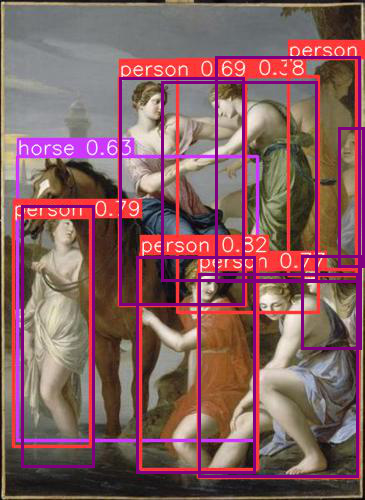

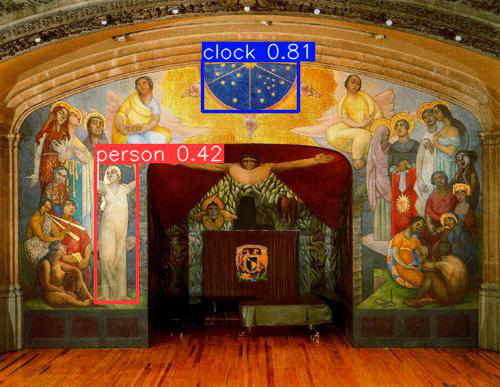

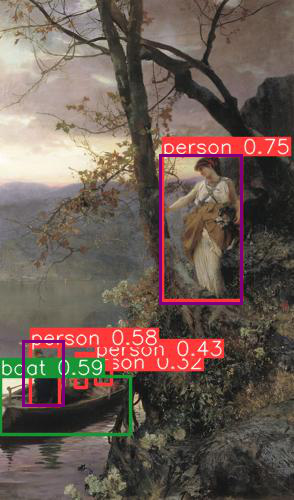

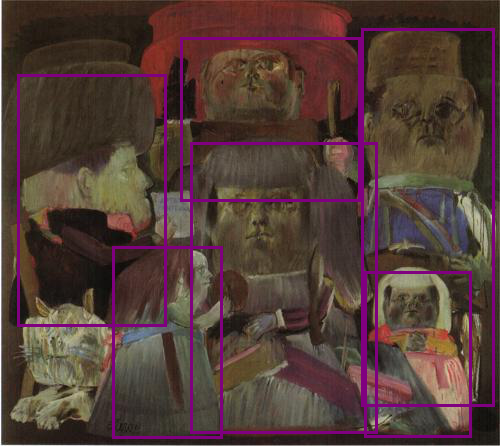

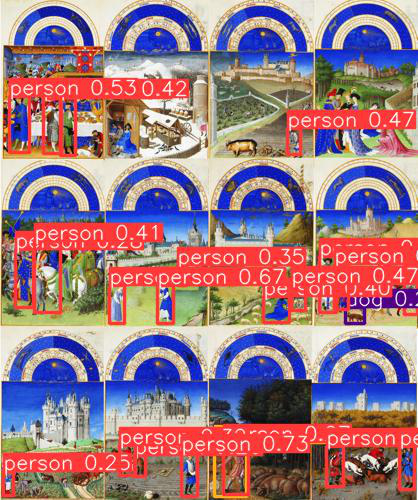

...

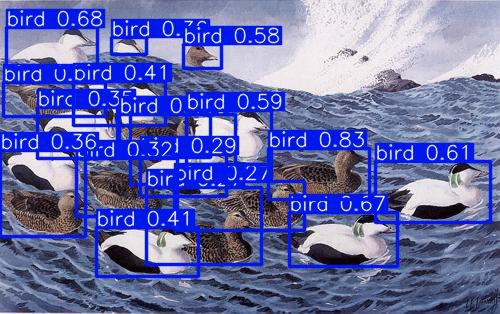

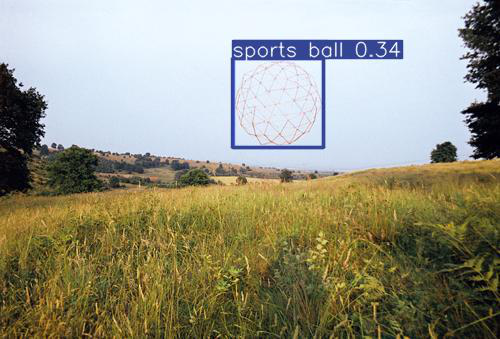

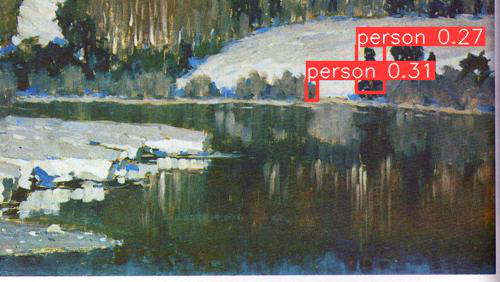

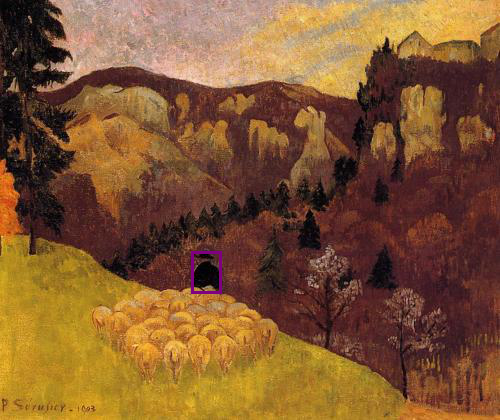

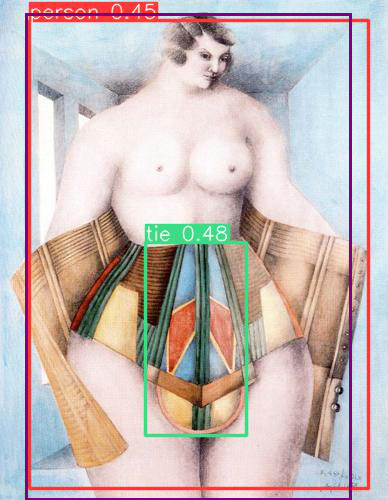

In [7]:
import pandas as pd
from pascal import PascalVOC
from PIL import ImageDraw


def get_annotation_bbox(image_file, folder):
    annotation_file = next((people_art_annotations / folder).glob(f"{image_file.name}.*"), None)

    if annotation_file is None:
        return None
    
    ann = PascalVOC.from_xml(annotation_file)
    bboxes = []
    for obj in ann.objects:
        p1 = (obj.bndbox.xmin, obj.bndbox.ymin)
        p2 = (obj.bndbox.xmax, obj.bndbox.ymax)
        bboxes.append((p1, p2))
    
    return bboxes


def draw_bbox(image, bbox):
    p1, p2 = bbox
    image_draw = ImageDraw.Draw(image)
    image_draw.rectangle((p1, p2), outline ="purple", width=3)
    
    
for image_file in image_files:
    image = Image.open(save_path / image_file.name)
    folder = image_file.parent.name
    # If there are no people in the image, None is returned, but we have to display it eihter way, so a None check
    # TODO use a Maybe Container / Monadic approach
    bboxes = get_annotation_bbox(image_file, folder)
    if bboxes is not None:
        for bbox in bboxes:
            draw_bbox(image, bbox)

    display(image)
    

## Part e

- Calculate the mean average precission over the whole dataset where people is predicted

In [8]:
from torchmetrics.detection.mean_ap import MeanAveragePrecision
from collections import defaultdict
import pandas as pd

In [9]:
# Load every ground truth bbox
ground_truth = {}

for directory in people_art_annotations.iterdir():
    if not directory.is_dir():
        continue
    for annotation_file in directory.glob("*"):
        ann = PascalVOC.from_xml(annotation_file)
        boxes_list = []
        target_list = []
        for obj in ann.objects:
            boxes_list.append(torch.tensor([obj.bndbox.xmin, obj.bndbox.ymin, obj.bndbox.xmax, obj.bndbox.ymax]))
            target_list.append(torch.tensor([0]))

        if len(boxes_list) > 0:
            picture = annotation_file.parent.name + "/" + annotation_file.stem.split(".")[0]
            ground_truth[picture] = dict(
                boxes=torch.stack(boxes_list).float(),
                labels=torch.cat(target_list).int()
            )
    #result.show()

In [10]:
people_predictions = {}

for directory in people_art_path.iterdir():
    for image_file in directory.glob("*.jpg"):

        image = Image.open(image_file)
        result = model(image)
        df = result.pandas().xyxy[0]
        # class 0 is person
        df_person = df[df["class"] == 0]
        if df_person.shape[0] == 0:
            continue   
        boxes_list = []
        target_list = []
        scores_list = []
        for _, row in df_person.iterrows():
            boxes_list.append(torch.tensor([row.xmin, row.ymin, row.xmax, row.ymax]))
            target_list.append(torch.tensor([0]).int())
            scores_list.append(torch.tensor([row.confidence]))

        image_name = image_file.parent.name + "/" + image_file.stem
        people_predictions[image_name] = dict(
            boxes = torch.stack(boxes_list),
            scores = torch.cat(scores_list),
            labels = torch.cat(target_list)
        )
    

Remark:  
As we can see in the next cell, there are less predictions than actuacl people in the ground truth.  
Since the exercise sheet says we should only focus on predictions with people, in my case this is the people_predictions dictionary.  The result will be too good, since alot of missing examples are not included. 

In [11]:
print(len(people_predictions))
print(len(ground_truth))

1147
1490


In [12]:
# calculate mean average precission

metric = MeanAveragePrecision(iou_thresholds=[0.5])
for image, preds in people_predictions.items():
    target = ground_truth.get(
        image, 
        dict(boxes=torch.tensor([[0, 0, 0, 0]]).float(), labels=torch.tensor([1]).float())
    )

    #print(target["boxes"].shape, preds["boxes"].shape)
    metric.update([preds], [target])
    
metric.compute()

{'map': tensor(0.24861),
 'map_50': tensor(0.24861),
 'map_75': tensor(-1),
 'map_small': tensor(0.06166),
 'map_medium': tensor(0.32822),
 'map_large': tensor(0.63366),
 'mar_1': tensor(0.15536),
 'mar_10': tensor(0.29942),
 'mar_100': tensor(0.30142),
 'mar_small': tensor(0.16286),
 'mar_medium': tensor(0.47246),
 'mar_large': tensor(0.70918),
 'map_per_class': tensor(-1.),
 'mar_100_per_class': tensor(-1.)}